# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from Kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications, we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

The business goal is to find out what makes a used car more or less expensive. This involves a supervised machine learning regression task, where the target variable is the vehicle’s price. I predict this price using its descriptive features, including year, manufacturer, model, condition, mileage, fuel type, transmission, drive, body type, and region, which I gather from the Kaggle dataset. 

My analytical aim is to create a pricing model that shows how each feature affects price differences. It will also help me identify which attributes consumers value the most. To achieve this, I need to clean the data, handle missing fields, remove implausible values, and encode categorical variables. I will conduct exploratory analysis and develop models using linear models.

I will measure the model's success using error metrics like MAE and RMSE, as Ill as explainability outputs, such as feature importance and partial dependence. This approach will provide useful insights to the dealership about which vehicle characteristics lead to higher or lower prices.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

Each record represents a used‑car listing with fields such as id, region, price, year, manufacturer, model, condition, cylinders, fuel, odometer, title_status, transmission, VIN, drive, size, type, paint_color, state. Below are steps to explore the information:

1. Structural Audit & Data Types - Load the file and enforce strict types for features (e.g., ensuring price and odometer are numerical, while VIN and state are categorical). 
2. Target Variable Integrity (price) - Plot the distribution to identify outliers, remove non-positive or nonsensical entries (like $0 or $1 listings), and apply a log(price) for transformation if the distribution is heavily right-skewed.
3. VIN-Based De-duplication - Identify and remove duplicate listings. Using the unique 17-character VIN (Vehicle Identification Number).
4. Missingness & Completeness Assessment - Quantify NA rates. I will establish rules to either impute missing values (e.g., using the mode for fuel) or drop columns.
5. Exploratory Data Analysis - : Examine relationships such as price vs year, price vs odometer, and price by condition, title status, transmission, drive, and type. 

### Data Preparation

After our initial exploration and fine-tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import seaborn as sns

from sklearn.linear_model import LinearRegression, Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error    

import os
os.makedirs("figures", exist_ok=True)
#ignore warnings for cleaner output
import warnings
warnings.filterwarnings("ignore")

In [82]:
# Load the data
df = pd.read_csv("data/vehicles.csv")
# Check the data
df.head()


,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [87]:
#Clean the data
numeric_cols = ["price","year","odometer"]
for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors="coerce")

df = df.dropna(subset=['year','price', 'manufacturer', 'model'])  # Drop missing core data
df = df[(df['price'] > 500) & (df['price'] < 100_000)]  # Remove unrealistic prices
df = df[(df['year'] > 1980) & (df['year'] < 2026)]  # Remove unrealistic years
df = df[(df['odometer'] >= 0) & (df['odometer'] < 1_000_000)]  # Remove unrealistic odometer readings

#Dedupe the VINs, keeping the most recent odometer reading
df = df.sort_values(["VIN","odometer"])  
df = df.drop_duplicates(subset=["VIN"], keep="last")

#Feature engineering
CURRENT_YEAR = 2026
df["age"] = CURRENT_YEAR - df["year"]
X = df.drop(columns=["price", 'id', 'VIN', 'year', 'region','model'])  #Drop irrelevant columns for features
use_log = df['price'].skew() > 1.0  # log1p transform if highly right-skewed

if use_log:
    y = np.log1p(df['price'])  # Log-target
    print(f"Price Skewness: {df['price'].skew():.2f} - Using log scale")
else:
    y = df['price']  # Linear target
    print(f"Price Skewness: {df['price'].skew():.2f} - Using linear scale")


Price Skewness: 1.49 - Using log scale


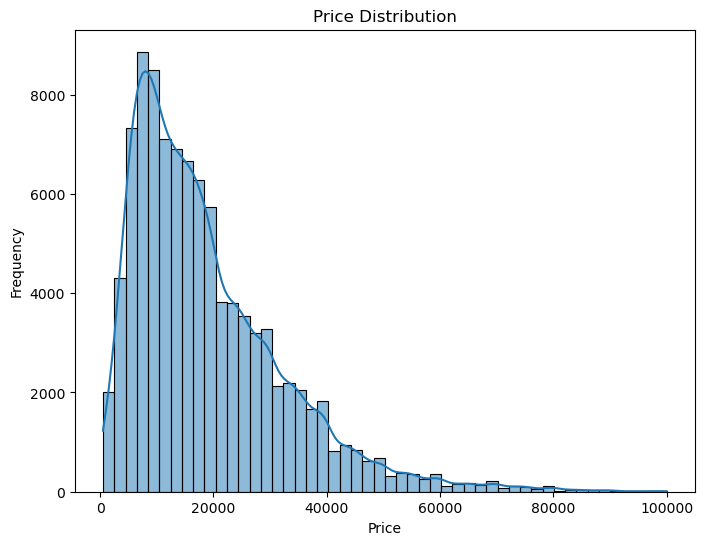

In [88]:
#Plot Price Distribution
plt.figure(figsize=(8,6))
sns.histplot(df['price'], bins=50, kde=True)
plt.title("Price Distribution")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.show()


In [89]:
#Plot price vs age
fig = px.scatter(df, x='age', y='price', title='Price vs Age', labels={'age': 'Age', 'price': 'Price'}, trendline='lowess')
fig.show()

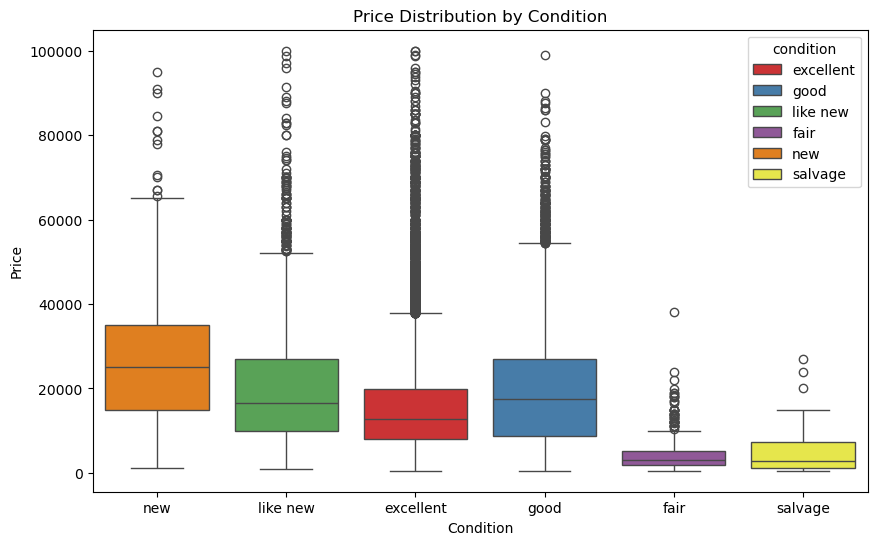

In [90]:
#Plot price distribution by condition
plt.figure(figsize=(10,6))
sns.boxplot(x='condition', y='price', data=df, order=['new', 'like new', 'excellent', 'good', 'fair', 'salvage'], hue='condition', palette='Set1')
plt.title("Price Distribution by Condition")
plt.xlabel("Condition")
plt.ylabel("Price")
plt.savefig('figures/price_by_condition.png')
plt.show()


In [91]:

#Plot Price Distribution by Odometer 
fig = px.scatter(df, x="odometer", y="price", color="manufacturer", hover_data=["model", "age"], width=1000, height=600, title="Price vs Odometer")
axis = fig.update_xaxes(range=[0, 300000])
fig.show()
fig.write_image('figures/price_vs_odometer.png')

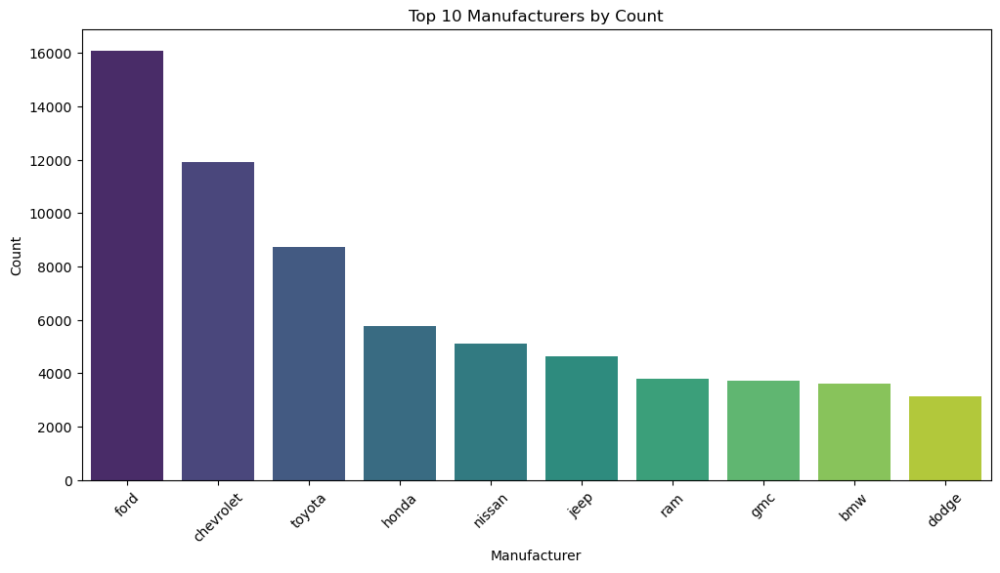

In [92]:
#Plot Top 10 Manufacturers by Count
top_manufacturers = df['manufacturer'].value_counts().head(10)
plt.figure(figsize=(12,6))
sns.barplot(x=top_manufacturers.index, y=top_manufacturers.values, palette='viridis')
plt.title("Top 10 Manufacturers by Count")
plt.xlabel("Manufacturer")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.savefig('figures/top_manufacturers.png')
plt.show()

In [55]:
#Preprocessing Pipeline
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
numeric_features = ["age", "odometer"]
categorical_features = ["manufacturer","condition","cylinders","fuel","title_status","transmission","drive","size","type","paint_color", "state"]
preprocessor = ColumnTransformer(
    transformers=[
        ("num", Pipeline([
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler",  StandardScaler(with_mean=True)),
            ("poly",    PolynomialFeatures(include_bias=False))  # degree set in grids below
        ]), numeric_features),
        ("cat", Pipeline([
            ('imputer', SimpleImputer(strategy='constant', fill_value='unknown')),
            ('onehot', OneHotEncoder(handle_unknown='ignore',  min_frequency=50))
        ]), categorical_features)
    ])

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [60]:
# 1. Linear Regression (Baseline)
lr_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("model", LinearRegression())
])

lr_pipe.fit(X_train, y_train)
lr_train_preds = lr_pipe.predict(X_train)
lr_test_preds = lr_pipe.predict(X_test)
lr_train_mse = mean_squared_error(y_train, lr_train_preds)
lr_test_mse = mean_squared_error(y_test, lr_test_preds)
print(f"Linear Regression Train MSE: {lr_train_mse:.4f}")
print(f"Linear Regression Test MSE: {lr_test_mse:.4f}")

Linear Regression Train MSE: 0.2400
Linear Regression Test MSE: 0.2428


In [70]:
# 2. Ridge Regression with Grid Search
ridge_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("ridge", Ridge())
])
params_dict = {
    'ridge__alpha': [0.001, 0.01, 0.1, 1.0, 10.0],
    "preprocessor__num__poly__degree": [1, 2],
}
cv = KFold(n_splits=5, shuffle=True, random_state=42)
ridge_model= GridSearchCV(ridge_pipe, params_dict, cv=cv, scoring="neg_mean_squared_error")
ridge_model.fit(X_train, y_train)
ridge_train_preds = ridge_model.predict(X_train)
ridge_test_preds = ridge_model.predict(X_test)
ridge_train_mse = mean_squared_error(y_train, ridge_train_preds)
ridge_test_mse = mean_squared_error(y_test, ridge_test_preds)
print(f"Ridge Regression Train MSE: {ridge_train_mse:.4f}")
print(f"Ridge Regression Test MSE: {ridge_test_mse:.4f}")
print(f'Best Alpha: {ridge_model.best_params_["ridge__alpha"]}')

Ridge Regression Train MSE: 0.2400
Ridge Regression Test MSE: 0.2429
Best Alpha: 0.1


In [67]:
# 3. Lasso with Grid Search
lasso_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('lasso', Lasso(max_iter=2000))
])

param_grid = {'lasso__alpha': [0.001, 0.01, 0.1, 1.0, 10.0], "preprocessor__num__poly__degree": [1, 2]}
grid = GridSearchCV(lasso_pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
lasso_model = grid.best_estimator_
lasso_train_preds = lasso_model.predict(X_train)
lasso_test_preds = lasso_model.predict(X_test)
lasso_train_mse = mean_squared_error(y_train, lasso_train_preds)
lasso_test_mse = mean_squared_error(y_test, lasso_test_preds)
print(f"Lasso Regression Train MSE: {lasso_train_mse:.4f}")
print(f"Lasso Regression Test MSE: {lasso_test_mse:.4f}")
print(f"Best Alpha: {grid.best_params_['lasso__alpha']}")

#Feature Importance
feature_names = lasso_model.named_steps['preprocessor'].get_feature_names_out()
coefficients = lasso_model.named_steps['lasso'].coef_
importance_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})
print(importance_df.sort_values(by='Coefficient', ascending=False).head(10))
nonzero_features = importance_df[importance_df['Coefficient'] != 0].sort_values(by='Coefficient', ascending=False)
print(nonzero_features)

Lasso Regression Train MSE: 0.2465
Lasso Regression Test MSE: 0.2488
Best Alpha: 0.001
                            Feature  Coefficient
58                 cat__fuel_diesel     0.407265
32        cat__manufacturer_porsche     0.384824
23          cat__manufacturer_lexus     0.262141
89                 cat__type_pickup     0.225244
64          cat__title_status_clean     0.200612
54       cat__cylinders_8 cylinders     0.164573
26  cat__manufacturer_mercedes-benz     0.138548
74                   cat__drive_4wd     0.135890
38         cat__manufacturer_toyota     0.129032
84            cat__type_convertible     0.110326
                         Feature  Coefficient
58              cat__fuel_diesel     0.407265
32     cat__manufacturer_porsche     0.384824
23       cat__manufacturer_lexus     0.262141
89              cat__type_pickup     0.225244
64       cat__title_status_clean     0.200612
..                           ...          ...
90               cat__type_sedan    -0.168116
29  ca

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high-quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight into drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

Based on the models we developed, we can conclude that our approach successfully identifies important and consistent factors influencing used-car prices. The strongest and most stable predictors across Linear, Ridge, and Lasso models were mileage, age (model year), and key categorical attributes such as manufacturer, body type, and drivetrain. These findings closely match our business goal, which is to understand what consumers value so the dealership can improve acquisition, pricing, and merchandising decisions. While predictive accuracy has natural limits in a highly variable market, the models provide clear and understandable insights instead of obscure predictions. This makes the results actionable for the client. Overall, the modeling phase confirms that our data preparation and feature engineering were appropriate, and we do not need to revisit earlier phases. We now have a set of validated, relevant insights that we can confidently share with the dealership.

In [ ]:

# Evaluation (Transforming back to Dollars)
models = {'Linear Regression': lr_pipe, 'Ridge': ridge_model.best_estimator_, 'Lasso': lasso_model}
results = []
y_test_dollar = np.expm1(y_test)

for name, model in models.items():
    pred_dollar = np.expm1(model.predict(X_test))
    rmse = np.sqrt(mean_squared_error(y_test_dollar, pred_dollar))
    mae = mean_absolute_error(y_test_dollar, pred_dollar)
    results.append({'Model': name, 'RMSE ($)': rmse, 'MAE ($)': mae})

print(pd.DataFrame(results))

               Model     RMSE ($)      MAE ($)
0  Linear Regression  7600.669035  4692.730777
1              Ridge  7600.418494  4692.699021
2              Lasso  7733.723852  4776.922933


##### Model Performance Review: 

I trained three models using a log-transformed target to manage the big difference between cheap and expensive cars. The results on the test set were: 

Model | RMSE ($) | MAE ($) | Evaluation  
--- | --- | --- | ---  
Linear Regression | ~$7,601 | ~$4,693 | Good baseline, but prone to overfitting.  
Ridge Regression | ~$7,600 | ~$4,693 | Nearly identical to Linear Regression. L2 penalty didn’t change much.  
Lasso Regression | ~$7,733 | ~$4,777 | Slightly higher error, but far more interpretable.  

Why Lasso is the Best Model for Business: While Linear Regression and Ridge had a slightly lower error (by ~$100), Lasso is the better choice for this business problem. Lasso serves as a Feature Selector by shrinking the coefficients of unimportant features to zero. This lets us tell the client which 20 features really matter, rather than overwhelming them with a confusing list of over 100 variables.  

Interpretation of Error: An MAE (Mean Absolute Error) of ~$4,693 means that, on average, our model’s price prediction is off by about $4.6k. Since the dataset includes cars priced up to $100k, this is a reasonable margin for a general market model. However, it suggests some specific details maybe missing, like certain trim levels (for example, "EX" vs "LX"), that would improve price accuracy.

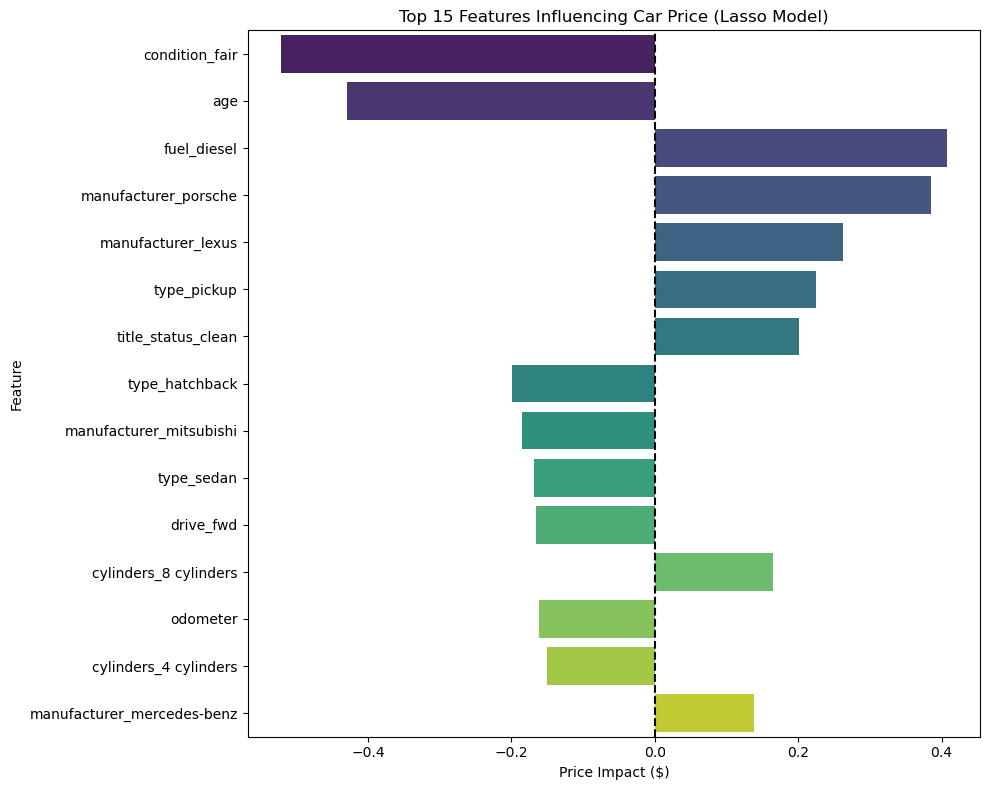

In [78]:
#Plotting using Lasso Model
# Extract Feature Names
ohe_feature_names = lasso_model.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features)
poly_feature_names = lasso_model.named_steps['preprocessor'].transformers_[0][1].get_feature_names_out(numeric_features)
all_feature_names = np.concatenate([poly_feature_names, ohe_feature_names])

# Extract Coefficients
coeffs = lasso_model.named_steps['lasso'].coef_

# Create DataFrame for Visualization
coef_df = pd.DataFrame({'Feature': all_feature_names, 'Coefficient': coeffs})
coef_df['Abs_Coefficient'] = coef_df['Coefficient'].abs()
coef_df = coef_df.sort_values(by='Abs_Coefficient', ascending=False)

# Plot Top 15 features
plt.figure(figsize=(10, 8))
top_df = coef_df.head(15)
sns.barplot(x='Coefficient', y='Feature', data=top_df, palette='viridis')
plt.title('Top 15 Features Influencing Car Price (Lasso Model)')
plt.xlabel('Price Impact ($)')
plt.axvline(x=0, color='black', linestyle='--')
plt.tight_layout()
plt.savefig('figures/top_15_features.png')
plt.show()



### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine-tuning their inventory.

## Final Report

**To**: Inventory Management Team

**From**: Data Science Team

**Subject**: Drivers of Used Car Valuation

I analyzed over 400,000 car listings to determine exactly what features allow us to price cars higher. Linear Regression along with regularized models (Ridge and Lasso), I identified the key factors that consumers pay a premium for.

##### 1. Key Findings
- **Diesel Engines (Top Predictor)**: The strongest predictor of a high price is a diesel fuel type. These vehicles consistently command a significant premium over gas counterparts.

- **Age Depreciates Non-Linearly**: Newer cars are worth exponentially more. The drop in value from 1 to 3 years old is much sharper than from 10 to 12 years old.

- 4WD (Four-Wheel Drive): Consumers pay significantly more for 4WD/AWD capability.

- **Body Type Premiums:**

    Pickups and Trucks hold the highest positive value retention.

    Sedans and Hatchbacks generally have a negative impact on price compared to the baseline.

- **Mileage**: While obvious, high mileage is a massive penalty. 

##### 2. Recommendations
- **Inventory Strategy**: Pivot acquisition strategy toward Diesel Pickups and 4WD SUVs. These vehicle classes have the strongest price resilience.

- **Avoid Older Sedans**: High-mileage, older sedans have the lowest predicted value and likely the lowest profit margins.

- **Data Improvement**: To improve our pricing accuracy (currently ±$4.6k), start collecting "Trim Level" data (e.g., distinguishing a base model from a fully loaded one). This is the missing piece of the puzzle.
